In [2]:
import pandas as pd
import numpy as np

from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image

plt.style.use('ggplot')

In [3]:
print('first time on Kaggle')

first time on Kaggle


In [4]:
annot = pd.read_parquet('/kaggle/input/textocr-text-extraction-from-images-dataset/annot.parquet')

In [5]:
imgs = pd.read_parquet('/kaggle/input/textocr-text-extraction-from-images-dataset/img.parquet')

In [6]:
img_fns = glob('/kaggle/input/textocr-text-extraction-from-images-dataset/train_val_images/train_images/*')

In [7]:
img_fns[1]

'/kaggle/input/textocr-text-extraction-from-images-dataset/train_val_images/train_images/c613956f36cbd5cd.jpg'

## Plot example images

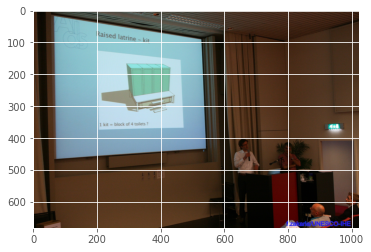

In [8]:
plt.imshow(plt.imread(img_fns[10]))

In [9]:
#get image ID to connect picture with its annotation
img_fns[1].split('/')[-1].split('.')[0]

'c613956f36cbd5cd'

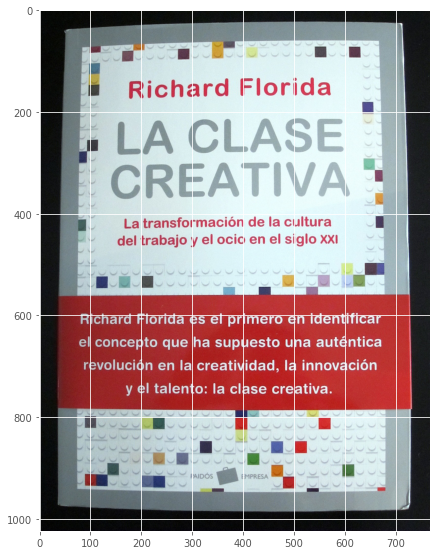

In [10]:
fig, ax = plt.subplots(figsize=(7,10))
ax.imshow(plt.imread(img_fns[1]))
# ax.axis('off')
plt.show()

In [11]:
image_id = img_fns[1].split('/')[-1].split('.')[0]
annot.query('image_id == @image_id')

,id,image_id,bbox,utf8_string,points,area
400942,c613956f36cbd5cd_1,c613956f36cbd5cd,"[296.72, 908.64, 45.83, 13.67]",PAIDÓS,"[297.09, 908.64, 342.55, 908.64, 342.55, 922.3...",626.50
400943,c613956f36cbd5cd_2,c613956f36cbd5cd,"[396.34, 910.98, 55.5, 12.22]",EMPRESA,"[396.34, 910.98, 451.84, 910.98, 451.52, 923.2...",678.21
400944,c613956f36cbd5cd_3,c613956f36cbd5cd,"[174.95, 131.84, 199.95, 45.09]",Richard,"[174.95, 132.95, 374.16, 131.84, 374.9, 172.13...",9015.75
400945,c613956f36cbd5cd_4,c613956f36cbd5cd,"[393.27, 130.47, 182.56, 42.46]",Florida,"[393.27, 130.47, 575.83, 131.32, 574.98, 171.6...",7751.50
400946,c613956f36cbd5cd_5,c613956f36cbd5cd,"[289.42, 210.03, 313.38, 74.0]",CLASE,"[289.42, 210.68, 601.52, 210.03, 602.8, 282.1,...",23190.12
400947,c613956f36cbd5cd_6,c613956f36cbd5cd,"[150.24, 214.26, 115.96, 71.14]",LA,"[150.24, 214.26, 266.2, 215.38, 265.64, 284.84...",8249.39
400948,c613956f36cbd5cd_7,c613956f36cbd5cd,"[136.86, 295.23, 478.25, 79.1]",CREATIVA,"[138.34, 295.23, 613.63, 295.97, 615.11, 369.8...",37829.57
400949,c613956f36cbd5cd_8,c613956f36cbd5cd,"[165.93, 407.96, 32.21, 23.25]",La,"[166.21, 407.96, 197.3, 408.52, 198.14, 430.65...",748.88
400950,c613956f36cbd5cd_9,c613956f36cbd5cd,"[202.76, 404.41, 201.41, 26.06]",transformación,"[202.76, 404.41, 403.85, 404.41, 404.17, 428.5...",5248.74
400951,c613956f36cbd5cd_10,c613956f36cbd5cd,"[409.62, 403.96, 35.02, 23.35]",de,"[409.62, 405.23, 444.43, 403.96, 444.64, 427.3...",817.72


## plot 20 first images

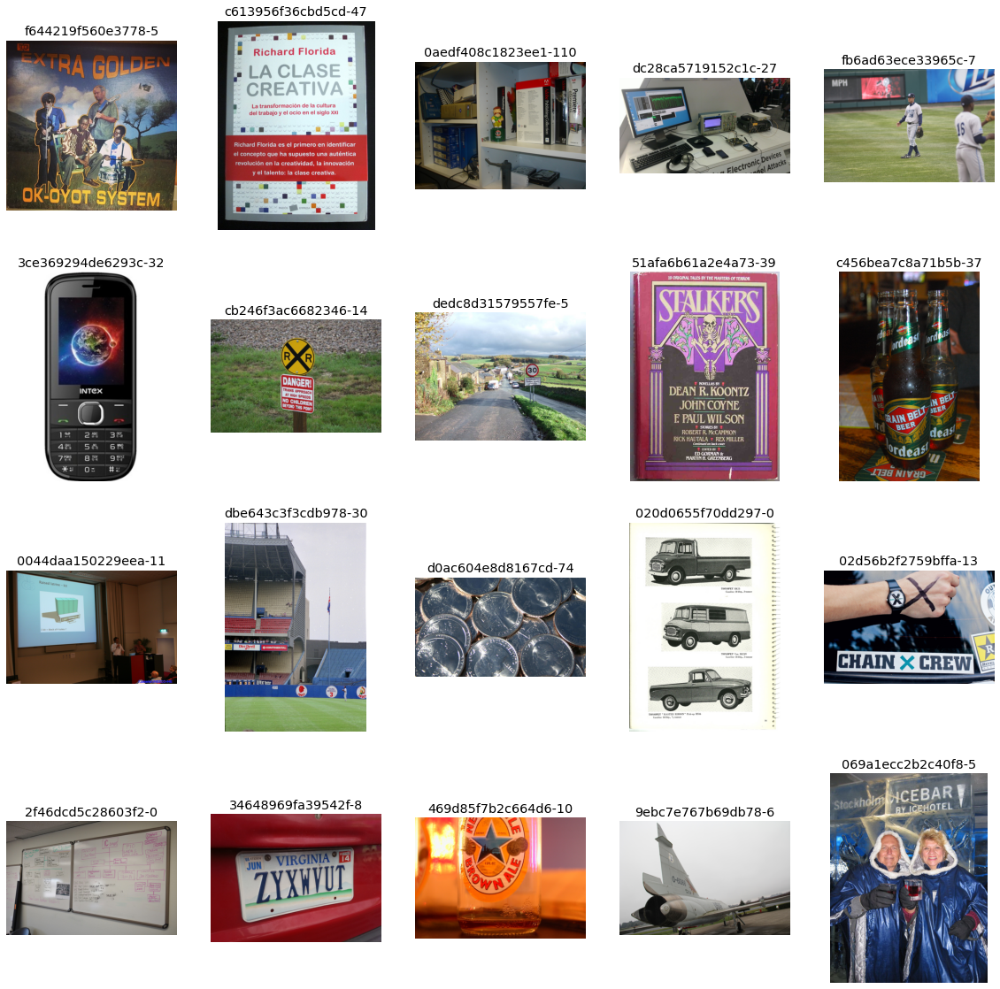

In [12]:
fig, axs = plt.subplots(4, 5, figsize=(20,20))
axs = axs.flatten()
for i in range (20):
    axs[i].imshow(plt.imread(img_fns[i]))
    axs[i].axis('off')
    image_id = img_fns[i].split('/')[-1].split('.')[0]
    n_annot = len(annot.query('image_id == @image_id'))
    axs[i].set_title(f'{image_id}-{n_annot}')
plt.show()

## Pytesseract

In [13]:
import pytesseract

In [14]:
#read 1 example
print(pytesseract.image_to_string(img_fns[1], lang='eng'))

## easyocr

In [15]:
import easyocr

In [16]:
reader = easyocr.Reader(['en'], gpu = True)

In [17]:
easyocr_result = reader.readtext(img_fns[1])

In [18]:
pd.DataFrame(easyocr_result, columns = ['bbox','text','conf'])

,bbox,text,conf
0,"[[168, 123], [583, 123], [583, 185], [168, 185]]",Richard Florida,0.994673
1,"[[148, 200], [610, 200], [610, 296], [148, 296]]",LA CLASE,0.901598
2,"[[135, 285], [618, 285], [618, 384], [135, 384]]",CREATIVA,0.907891
3,"[[163, 398], [579, 398], [579, 438], [163, 438]]",La transformacion de Ia cultura,0.563116
4,"[[151, 435], [591, 435], [591, 473], [151, 473]]",del trabajo y el ocio en el siglo XXI,0.769094
5,"[[76, 587], [677, 587], [677, 629], [76, 629]]",Richard Florida es el primero en identificar,0.567231
6,"[[76, 640], [106, 640], [106, 668], [76, 668]]",el,0.999860
7,"[[105, 633], [679, 633], [679, 677], [105, 677]]",concepto que ha supuesto una autentica,0.819380
8,"[[83, 678], [671, 678], [671, 719], [83, 719]]","revolucion en Ia creatividad, Ia innovacion",0.697801
9,"[[165, 727], [577, 727], [577, 763], [165, 763]]",y el talento: Ia clase creativa.,0.855506


## Keras OCR

In [19]:
!pip install keras-ocr -q


In [20]:
import keras_ocr

In [21]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [22]:
keras_result = pipeline.recognize([img_fns[1]])

In [23]:
keras_result

[[('florida',
   array([[395.0835 , 130.05861],
          [575.1986 , 131.22063],
          [574.9348 , 172.10924],
          [394.8197 , 170.94722]], dtype=float32)),
  ('richard',
   array([[175.10545, 138.16315],
          [374.48395, 131.51721],
          [375.8291 , 171.87238],
          [176.45062, 178.51831]], dtype=float32)),
  ('clase',
   array([[298.79855, 209.63759],
          [599.8589 , 208.4088 ],
          [600.1549 , 280.94226],
          [299.0946 , 282.17108]], dtype=float32)),
  ('la',
   array([[157., 217.],
          [260., 217.],
          [260., 284.],
          [157., 284.]], dtype=float32)),
  ('creativa',
   array([[144.4721 , 300.88824],
          [605.7616 , 295.7198 ],
          [606.56384, 367.32147],
          [145.27435, 372.48993]], dtype=float32)),
  ('de',
   array([[410., 404.],
          [446., 404.],
          [446., 428.],
          [410., 428.]], dtype=float32)),
  ('cultura',
   array([[479.75684, 404.5406 ],
          [575.9043 , 403.33875],
 

In [24]:
pd.DataFrame(keras_result[0],columns=['text','bbox'])

,text,bbox
0,florida,"[[395.0835, 130.05861], [575.1986, 131.22063],..."
1,richard,"[[175.10545, 138.16315], [374.48395, 131.51721..."
2,clase,"[[298.79855, 209.63759], [599.8589, 208.4088],..."
3,la,"[[157.0, 217.0], [260.0, 217.0], [260.0, 284.0..."
4,creativa,"[[144.4721, 300.88824], [605.7616, 295.7198], ..."
5,de,"[[410.0, 404.0], [446.0, 404.0], [446.0, 428.0..."
6,cultura,"[[479.75684, 404.5406], [575.9043, 403.33875],..."
7,transformacion,"[[201.69798, 407.06522], [404.89377, 403.98648..."
8,la,"[[449.0, 405.0], [475.0, 405.0], [475.0, 428.0..."
9,la,"[[166.0, 409.0], [199.0, 409.0], [199.0, 432.0..."


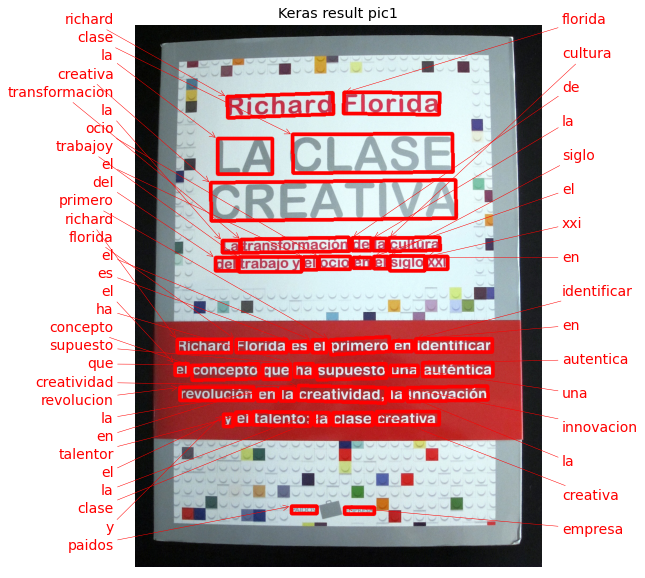

In [25]:
fig, ax = plt.subplots(figsize=(10,10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[1]),keras_result[0],ax=ax)
ax.set_title('Keras result pic1')
plt.show()

## compare between easyocr and keras_ocr

In [26]:
# First: easy ocr
# turn on GPU to accelarate, especially for keras ocr
reader = easyocr.Reader(['en'], gpu = True)

dfs=[]
for img in tqdm(img_fns[:20]):
    easyocr_result = reader.readtext(img)
    image_id = img.split('/')[-1].split('.')[0]
    # Create a NEW DataFrame for each image
    img_df = pd.DataFrame(easyocr_result, columns = ['bbox','text','conf'])
    img_df['img_id'] = image_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

  0%|          | 0/20 [00:00<?, ?it/s]

In [27]:
easyocr_df

,bbox,text,conf,img_id
0,"[[67, 23], [143, 23], [143, 65], [67, 65]]",I3,0.020780,f644219f560e3778
1,"[[59, 40], [1005, 40], [1005, 249], [59, 249]]",EXTRA GOLDEN,0.458488,f644219f560e3778
2,"[[85, 863], [939, 863], [939, 1015], [85, 1015]]",Ok-OYOT SYSTEM,0.595196,f644219f560e3778
0,"[[168, 123], [583, 123], [583, 185], [168, 185]]",Richard Florida,0.994673,c613956f36cbd5cd
1,"[[148, 200], [610, 200], [610, 296], [148, 296]]",LA CLASE,0.901598,c613956f36cbd5cd
...,...,...,...,...
0,"[[315.31215814362656, 319.0475386341112], [417...",0-0868,0.432883,9ebc7e767b69db78
0,"[[313, 159], [383, 159], [383, 201], [313, 201]]",BY,0.368554,069a1ecc2b2c40f8
1,"[[369, 129], [606, 129], [606, 204], [369, 204]]",JCEHOTEL,0.794017,069a1ecc2b2c40f8
2,"[[286.6304381980899, 74.2847966121687], [607.4...",HICEBAR,0.539148,069a1ecc2b2c40f8


In [43]:
#keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()
dfs = []
for img in tqdm(img_fns[:20]):
    results = pipeline.recognize([img])
    keras_result = results[0]
    # Create a NEW DataFrame for each image
    img_df = pd.DataFrame(keras_result,columns=['text','bbox'])
    image_id = img.split('/')[-1].split('.')[0]
    img_df['img_id'] = image_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/20 [00:00<?, ?it/s]

In [44]:
kerasocr_df

,text,bbox,img_id
0,csao,"[[72.295586, 27.383974], [139.163, 30.903313],...",f644219f560e3778
1,extra,"[[94.588486, 57.982773], [484.56476, 99.580246...",f644219f560e3778
2,colden,"[[517.9999, 93.999985], [981.9999, 93.999985],...",f644219f560e3778
3,okoyot,"[[100.21785, 854.40204], [512.209, 871.4499], ...",f644219f560e3778
4,system,"[[544.1471, 893.9118], [924.80774, 912.0385], ...",f644219f560e3778
...,...,...,...
2,sn,"[[560.0, 497.0], [621.0, 497.0], [621.0, 539.0...",9ebc7e767b69db78
0,ncebar,"[[287.45544, 86.55446], [597.25745, 55.574265]...",069a1ecc2b2c40f8
1,stockhohn,"[[13.517586, 133.45143], [259.24173, 104.87887...",069a1ecc2b2c40f8
2,icehotel,"[[380.05487, 156.84793], [596.98334, 139.3772]...",069a1ecc2b2c40f8


## Plot Results: easyocr vs keras_ocr

In [36]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1,2, figsize = (20,20))

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), easy_results, ax=axs[0])
    axs[0].set_title('easyocr_results')

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), keras_results, ax=axs[1])
    axs[1].set_title('kerasocr_results')
    plt.show()



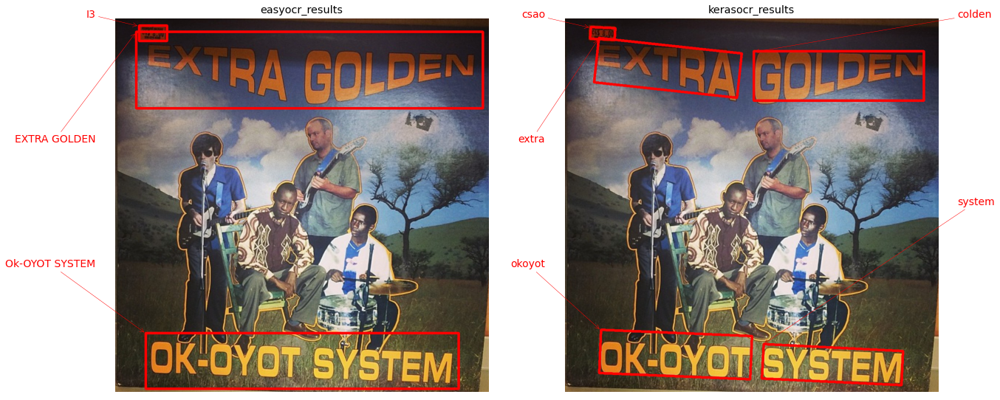

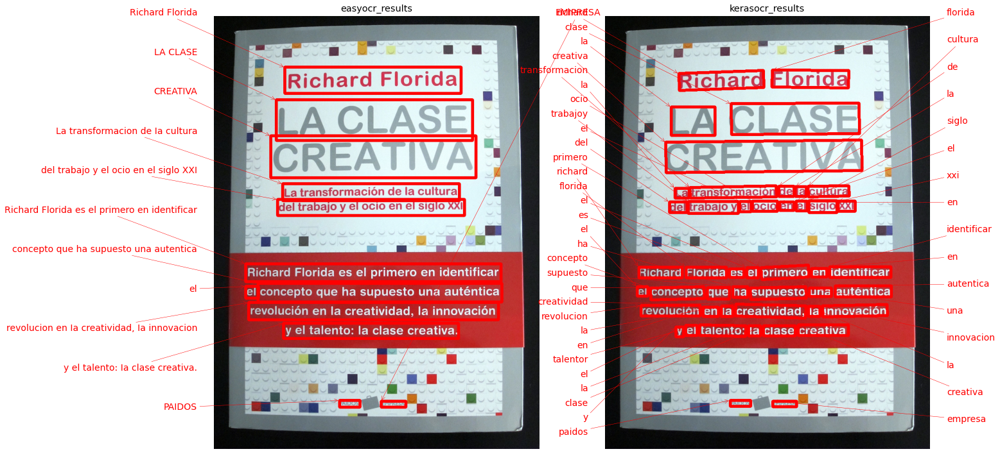

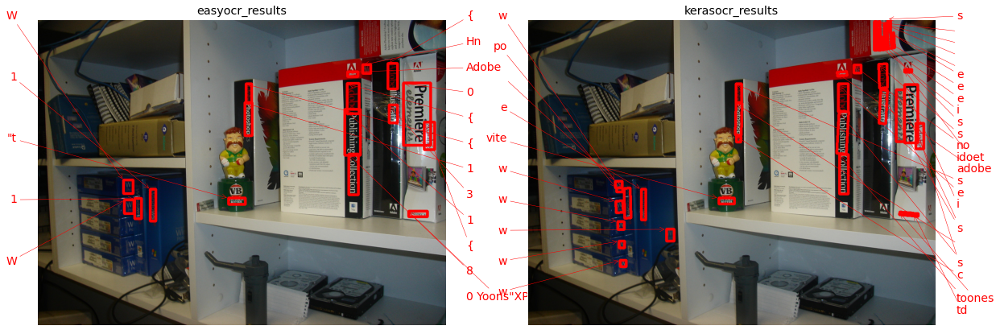

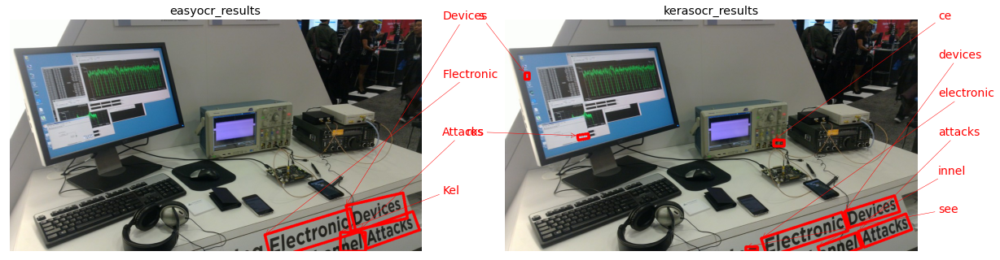

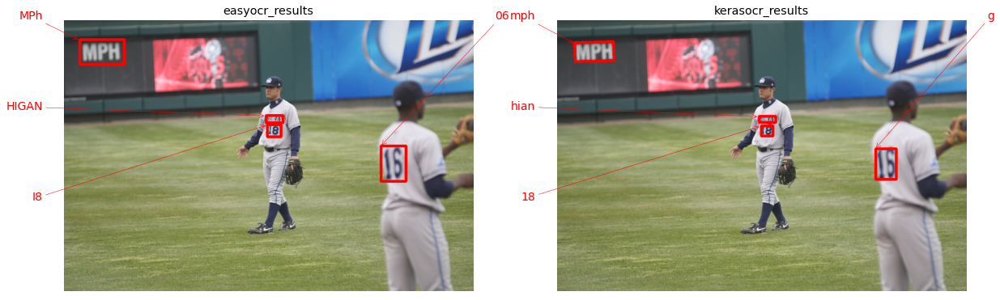

...

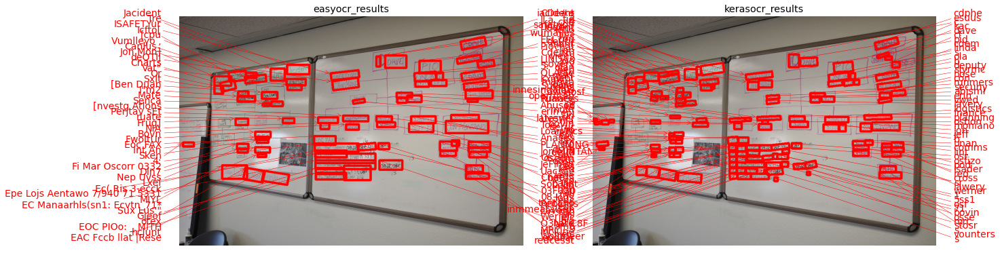

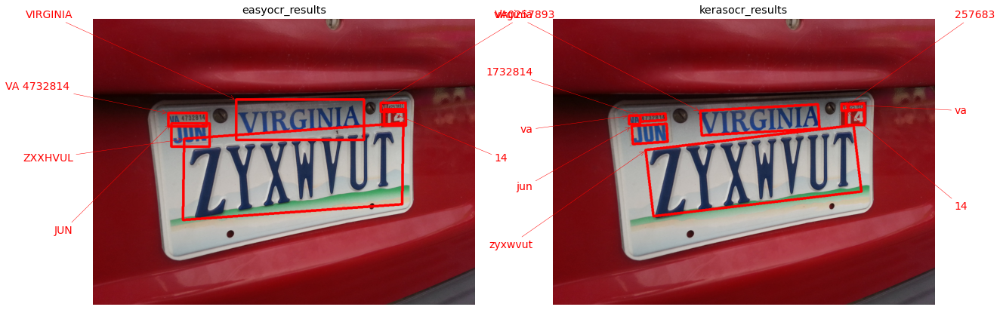

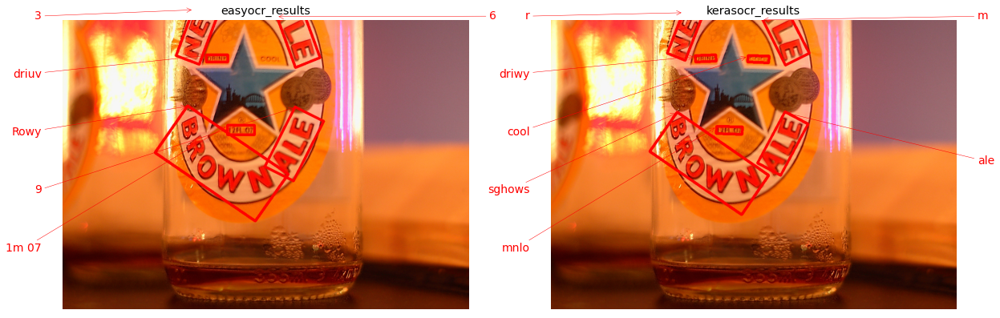

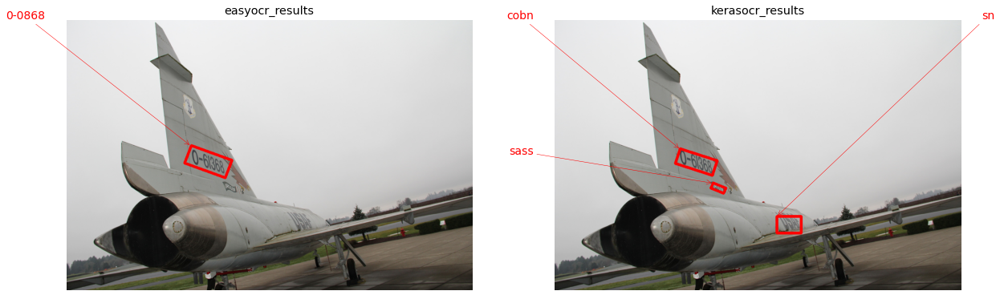

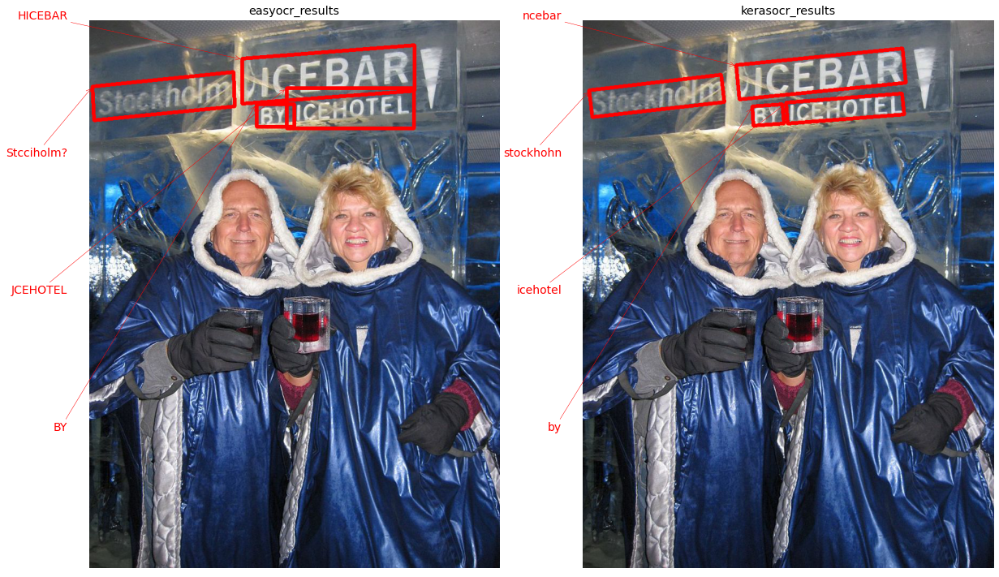

In [45]:
# loop over the result
for img_fn in img_fns[:20]:
    plot_compare(img_fn, easyocr_df, kerasocr_df)

In [40]:
for img_fn in img_fns[:20]:
    img_id = img_fn.split('/')[-1].split('.')[0]
    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    print(keras_results)  # Check if this list is empty

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[('BY', array([[313, 159],
       [383, 159],
       [383, 201],
       [313, 201]])), ('JCEHOTEL', array([[369, 129],
       [606, 129],
       [606, 204],
       [369, 204]])), ('HICEBAR', array([[286.6304382 ,  74.28479661],
       [607.47420966,  49.80010137],
       [607.3695618 , 134.71520339],
       [286.52579034, 158.19989863]])), ('Stcciholm?', array([[  7.30769231, 126.53846154],
       [270.61903348,  99.72219496],
       [272.69230769, 163.46153846],
       [ 10.38096652, 189.27780504]])), ('BY', array([[313, 159],
       [383, 159],
       [383, 201],
       [313, 201]])), ('JCEHOTEL', array([[369, 129],
       [606, 129],
       [606, 204],
       [369, 204]])), ('HICEBAR', array([[286.6304382 ,  74.28479661],
       [607.47420966,  49.80010137],
       [607.3695618 , 134.71520339],
       [286.52579034, 158.19989863]])), ('Stcciholm?', array([[  7.30769231, 126.53846154],
       [270.61903348,  99.72219496],
     